In [14]:
using DataFrames
using CSV
using Plots
using ModelingToolkit, OrdinaryDiffEq, LinearAlgebra
using DifferentialEquations
using DataDrivenDiffEq
using DataDrivenSparse
using StatsPlots
using Statistics
using Distributions
using DSP
using Dates
using PlotThemes
using Turing, MCMCChains

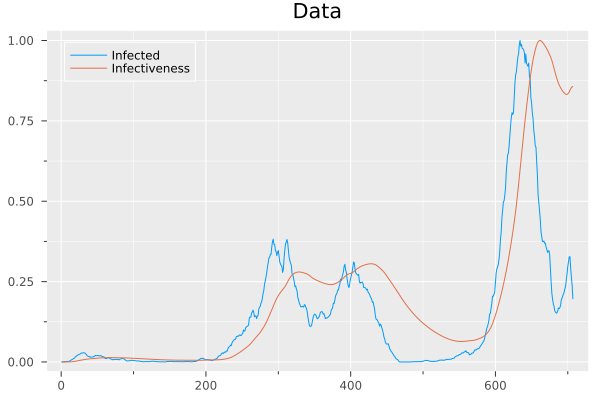

In [3]:
#################### Making the Data #######################################
theme(:ggplot2)
###### it must be 1 to 350(first year) or 350 to 680 (second year)
start_training=350
finish_training=680
##### specify the range you want to chop out for prediction
split_start=400
split_finish=430
# 1==> 0-4, 2==> 5-14, 3==> 15-34, 4==> 35-59, 5==> 60-79, 6==> 80+
age_group=5

begin
    #training_days=680 #707 days are recorded
    raw_data=CSV.File("Thuringen-SIRD-Grouped-2.csv") |> DataFrame
    #data=Matrix(data[:,[[2:7] [9:14] [37:42] [44:49]]])
    data=Matrix(raw_data[:,[2, 3, 4, 5, 6, 7, 15, 16]])'  #37, 38, 39, 40, 41, 42
    data1=Matrix(raw_data[:,[age_group+1, 15]])' 
    ##### 15 , 16 (now 2, 3) reserved for contagion level of the age group and the rest ##########################
   
    ####### h_data will be used for 1-hospitalization and 2-ICU modeling ##########################
    h_data= Matrix(raw_data[:,[age_group+36, age_group+43]])' 
    #plot(h_data')
    h_data_end=copy(h_data)
    
    
   
    #plot(h_data')
    


    ############# Beta distribution
    #d=Beta(1.5,2.5)
    #plot(d)

    function factors(α, β, n) ## Beta distribution, coefficients for n days needed (Infected)
        d=Beta(α, β)
        max=pdf(d, mode(d))
        step=1/(n+2-1)
        steps=collect(0.0:step: 1.0)
        coefs=zeros(length(steps))
        for i in eachindex(coefs)
            coefs[i]=pdf(d,steps[i])/max
        end
        return steps[2:end-1], coefs[2:end-1]
    end

    n=14  #### number of days that infection rate of each patient changes
    vals, cofs=factors(2.5,4.5,n) #### α=1.5 and β=2.5, we can change the curve shape by changing α and β

    #plot(cofs)
    #plot!(data')
    ###############################  factors should be  used ######################

    infectiveness=zeros(size(data)[2],6);

    infectiveness=[conv(cofs, data[i,:])[1:size(data)[2]] for i in 1:6]
    infectiveness=reduce(hcat, infectiveness)
    #plot(infectiveness[:, age_group])
    last=size(infectiveness)[1]
    for i in 1:last
        infectiveness[i,:]=mean(infectiveness[max(1,i-10):min(i, last),:], dims=1)
    end
    #plot(infectiveness[:, age_group])
   
    infectiveness_total=sum(infectiveness,dims=2)
    infectiveness_agegroup=infectiveness[:,age_group]
    #infectiveness_rest=tmp1.-infectiveness_agegroup
    data1[1,:]=data[age_group,:]
    data1[2,:]=infectiveness_total
    #data1[3,:]=infectiveness_rest

    Max_data1=[maximum(data1[i,1:end]) for i in 1:size(data1)[1]]
    #Max1=2000000#maximum(data1)
    Min=0#minimum(data1)
    for i in 1:size(data1)[1]
        for j in 1:size(data1)[2]
            data1[i,j]=(data1[i,j]-Min)/(Max_data1[i]-Min)
        end
    end 

    #plot(data1')
    
    Max_h_data=[maximum(h_data[i,1:end]) for i in 1:size(h_data)[1]]
    Min=0#minimum(data1)
    for i in 1:size(h_data)[1]
       for j in 1:size(h_data)[2]
           h_data[i,j]=(h_data[i,j]-Min)/(Max_h_data[i]-Min)
       end
    end 

     # smoothing
     #h_test=copy(h_data)
     last=size(h_data)[2]
     #for j in 1:size(h_data)[1]
        for i in 1:last
             h_data[:,i]=mean(h_data[:,max(1,i-3):min(i+2, last)], dims=2)
        end
    #end

    #plot(h_data')
    h_data1=h_data[:,start_training:split_start]
    h_data2=h_data[:,split_finish:finish_training]
    

    data2=data1[:,start_training:split_start]
    data3=data1[:,split_finish:finish_training]
    #plot!(data1[1:6,:]')
    #### I D
    #X=data1[:,1:674] # data or data1
    X1=data2
    X2=data3
    
    #smoothing the X1 and X2
    s=size(X1)[2]
    for i in 1:s
        X1[1,i]=mean(X1[1,max(1,i):min(s,i)])
    end
    s=size(X2)[2]
    for i in 1:s
        X2[1,i]=mean(X2[1,max(1,i):min(s,i)])
    end
    plot(data1', title="Data", label=["Infected" "Infectiveness"])

end

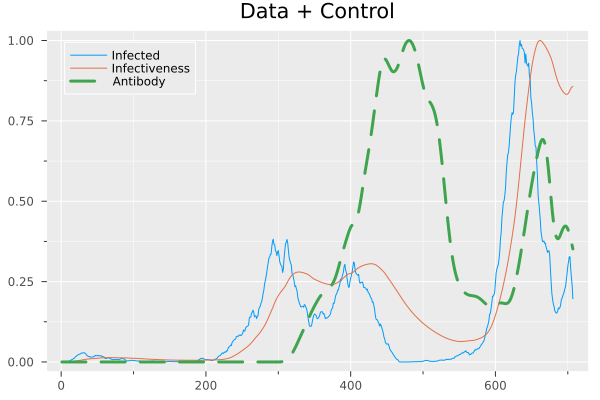

In [4]:
############################# Making control signal ########################
begin
    v_raw_data=CSV.File("Thuringen_agegroup_vaccination.csv") |> DataFrame
    v_data=Matrix{Float64}(v_raw_data[:,[2, 5, 8, 11, 14, 17, 20, 23, 26, 29, 32, 35]])'
    #h_v_data=Matrix{Float64}(v_raw_data[:,[2, 5, 8, 11, 14, 17, 20, 23, 26, 29, 32, 35]])'
    #vscodedisplay(v_raw_data)

    #plot(v_data')
    ####  weekly averaging
    avg_days=7
    s=size(v_data)
    weekly=Matrix{Float64}(undef,s[1], s[2])
    for i in 1:size(v_data)[1]
        weekly[i,:]=[mean(v_data[i, max(j-avg_days,1):j]) for j in 1:s[2]]'
    end
    
    ############# beta distribution  
    #d=Beta(3,3)
    #plot(d)
    

    n=35 ## number of days antibody grows and comes down
    vvals, vcofs=factors(3,4,n) #### α=4 and β=4, we can change the curve shape by changing α and β
    #plot(vcofs)


    ###############################  factors should be reversed and used ######################
    
    dose1_5_11=zeros(size(v_data)[2],1);
    dose1_12_17=zeros(size(v_data)[2],1);
    dose1_18_59=zeros(size(v_data)[2],1);
    dose1_60=zeros(size(v_data)[2],1);

    dose2_5_11=zeros(size(v_data)[2],1);
    dose2_12_17=zeros(size(v_data)[2],1);
    dose2_18_59=zeros(size(v_data)[2],1);
    dose2_60=zeros(size(v_data)[2],1);
    
    dose3_5_11=zeros(size(v_data)[2],1);
    dose3_12_17=zeros(size(v_data)[2],1);
    dose3_18_59=zeros(size(v_data)[2],1);
    dose3_60=zeros(size(v_data)[2],1);

    #weekly[:, split_start-difference-35:split_finish-difference-20].=0
    #weekly[:, split_start-difference:split_finish-difference].=0
    whole_antibody=zeros(size(v_data)[2],12)
    whole_antibody=[conv(vcofs, weekly[i,:])[1:size(v_data)[2]] for i in 1:12]
    whole_antibody=reduce(hcat, whole_antibody)

    dose1_5_11=whole_antibody[:,1];
    dose1_12_17=whole_antibody[:,2];
    dose1_18_59=whole_antibody[:,3];
    dose1_60=whole_antibody[:,4];

    dose2_5_11=whole_antibody[:,5];
    dose2_12_17=whole_antibody[:,6];
    dose2_18_59=whole_antibody[:,7];
    dose2_60=whole_antibody[:,8];
    
    dose3_5_11=whole_antibody[:,9];
    dose3_12_17=whole_antibody[:,10];
    dose3_18_59=whole_antibody[:,11];
    dose3_60=whole_antibody[:,12];
   

    dose1_5_11_1=zeros(size(data)[2],1);
    dose1_12_17_1=zeros(size(data)[2],1);
    dose1_18_59_1=zeros(size(data)[2],1);
    dose1_60_1=zeros(size(data)[2],1);

    dose2_5_11_1=zeros(size(data)[2],1);
    dose2_12_17_1=zeros(size(data)[2],1);
    dose2_18_59_1=zeros(size(data)[2],1);
    dose2_60_1=zeros(size(data)[2],1);
    
    dose3_5_11_1=zeros(size(data)[2],1);
    dose3_12_17_1=zeros(size(data)[2],1);
    dose3_18_59_1=zeros(size(data)[2],1);
    dose3_60_1=zeros(size(data)[2],1);


    difference=Dates.value(v_raw_data[1,1]-raw_data[1,1])
    for i in difference+1:lastindex(dose1_5_11_1)
        dose1_5_11_1[i]=dose1_5_11[i-difference]
        dose1_12_17_1[i]=dose1_12_17[i-difference]
        dose1_18_59_1[i]=dose1_18_59[i-difference]
        dose1_60_1[i]=dose1_60[i-difference]

        dose2_5_11_1[i]=dose2_5_11[i-difference]
        dose2_12_17_1[i]=dose2_12_17[i-difference]
        dose2_18_59_1[i]=dose2_18_59[i-difference]
        dose2_60_1[i]=dose2_60[i-difference]

        dose3_5_11_1[i]=dose3_5_11[i-difference]
        dose3_12_17_1[i]=dose3_12_17[i-difference]
        dose3_18_59_1[i]=dose3_18_59[i-difference]
        dose3_60_1[i]=dose3_60[i-difference]
    end

    #plot(dose11)
    antibody_5_11= dose1_5_11_1 .+  dose2_5_11_1 .+  dose3_5_11_1
    antibody_12_17= dose1_12_17_1 .+  dose2_12_17_1 .+  dose3_12_17_1
    antibody_18_59= dose1_18_59_1 .+  dose2_18_59_1 .+  dose3_5_11_1
    antibody_60= dose1_60_1 .+  dose2_60_1 .+  dose3_60_1

    antibody_5_17=antibody_5_11.+antibody_12_17

   
    total_antibody=antibody_5_17.+antibody_18_59.+antibody_60
    Max_antibody=maximum(total_antibody)
    Min=0
    for i in eachindex(total_antibody)
        total_antibody[i]=(total_antibody[i]-Min)/(Max_antibody-Min)
    end
    control=vcat( total_antibody') ### used in prediction
    control1=vcat( total_antibody[start_training:split_start]')
    control2=vcat( total_antibody[split_finish:finish_training]')
   
    if age_group==1 # 0-4
        antibody_age_group=zeros(size(data)[2],1)
    elseif age_group==2 # 5-14
        antibody_age_group=antibody_5_17
    elseif age_group==3 15-34
        antibody_age_group=antibody_18_59
    elseif age_group==4 #35-59
        antibody_age_group=antibody_18_59
    elseif age_group==5
        antibody_age_group=antibody_60
    elseif age_group==6
        antibody_age_group=antibody_60
    end
    Max_antibody_agegroup=maximum(antibody_age_group)
    antibody_age_group=antibody_age_group/Max_antibody_agegroup
   

    Max_infectiveness_agegroup=maximum(infectiveness_agegroup)
    infectiveness_age_group=infectiveness_agegroup/Max_infectiveness_agegroup
  


    infected_age_group=data1[1,:]

    hcontrol=vcat(infected_age_group')
    hcontrol1=vcat(infected_age_group[start_training:split_start]')
    hcontrol2=vcat(infected_age_group[split_finish:finish_training]')
    
    plot!(control', lw=3, ls=:dash, title="Data + Control", label="Antibody")
end

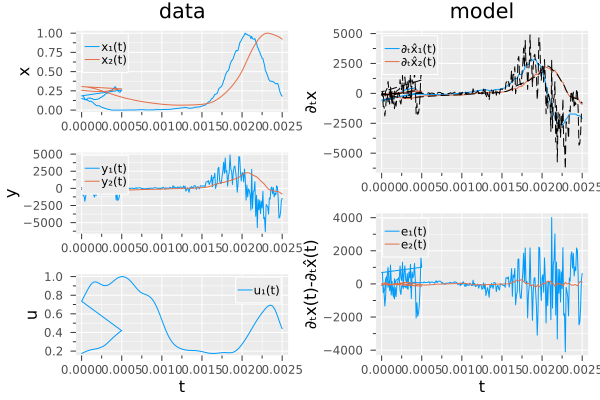

In [5]:
######################## definition and solving of the problem ##################
begin
    tick=100000
    t1=collect(0.0:1/tick:(split_start-start_training)/tick);
    itp_method=InterpolationMethod(LinearInterpolation)
    sir_problem1=ContinuousDataDrivenProblem(X1, t1, itp_method, U = control1)

    t2=collect(0.0:1/tick:(finish_training-split_finish)/tick);
    sir_problem2=ContinuousDataDrivenProblem(X2, t2, itp_method, U = control2)
    
    final_data=(prob1=(X=X1, t=t1, itp_method, U=control1), prob2=(X=X2, t=t2, itp_method, U=control2))
    sir_problem=ContinuousDataset(final_data)#(sir_problem1, sir_problem2)

    @variables u[1:2] c[1:1]
    u = collect(u)
    c = collect(c)

   
    h = Num[polynomial_basis([u; c], 2);]
   
    basis = Basis(h, u, controls=c)


    ### choosing STLSQ as an optimizer
    ### STLSQ is a sparsifying algorithm that cause the solve function to call its "Sindy" method ###
    opt = STLSQ(exp10.(-8:0.01:1))

    ddsol = solve(sir_problem, basis, opt)#, options = DataDrivenCommonOptions(data_processing = sampler, digits = 1))#, options = DataDrivenCommonOptions(data_processing = sampler), digits = 1)
    plot(plot(sir_problem, title="data"),plot(ddsol, title="model"), layout=(1,2))
  
end

In [6]:
################## recovering the dynamic########################
begin

    ##### range of prediction ####
    start=split_start
    finish=split_finish
    
    
    res=ddsol
    sys = get_basis(res)
    #println(sys)

    # Optimal parameters
    p_opt = get_parameter_values(sys)
    z0=X1[:,end]#data1[:,start]
    ztspan=(start/tick,finish/tick)

    z0_h=h_data[:,start]

    #control[:,286:300].=0.2

    function get_total_antibody(t)
        down=control[1, Int(round(t*tick+1, RoundDown))]
        up=control[1, Int(round(t*tick+1, RoundUp))]
        down_co=t*tick-round(t*tick,RoundDown)
        up_co=1-down_co
        control_in_t=down_co*down+up_co*up
        return control_in_t

        #return control[1, Int(round(t+1))]
    end

    # Generate a closure on the system 
    f_recovered = let total1 = get_total_antibody
        (x, p, t) -> sys(x, p, t, [total1.(t)])
    end
    sys
end

Model ##Basis#308 with 2 equations
States (2):
  u[1]
  u[2]
Parameters (20):
  p₁
  p₂
  p₃
  p₄
⋮

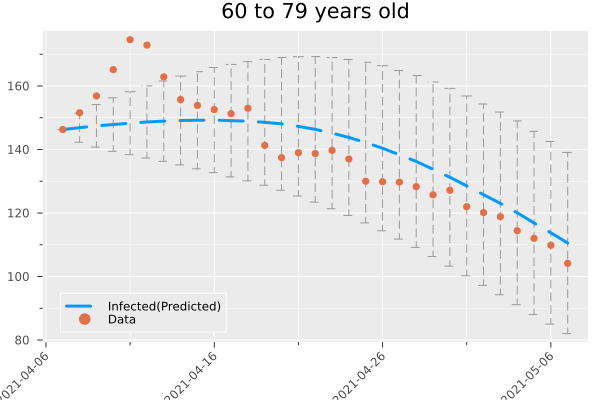

In [7]:
#################### stochastic #########################
#control[split_start:split_finish].=control[split_start:split_finish].*0
#plot(control')
begin
    t_step=1/tick
    beta=10
    g(u,p,t)=beta*u   #### stochastic function and its parameters

    ################## StatsPlots ################
    y1 = fill(NaN, finish-start+1, 5000);
    y2 = fill(NaN, finish-start+1, 5000);
    y3 = fill(NaN, finish-start+1, 5000);
    y4 = fill(NaN, finish-start+1, 5000);
    for i  in 1:5000
        prediction_prob = SDEProblem(f_recovered, g, z0, ztspan, p_opt)
        prediction = solve(prediction_prob, EM(), dt=t_step)
        M=Matrix(prediction)
               
        y1[:,i]=max.(M[1,:].-(z0[1]-data1[1,start]),0)
        y2[:,i]=M[2,:]

        y3[:,i]=max.(M[1,:].-(M[1,1]-z0_h[1]),0) #h_data[1,start]
        y4[:,i]=max.(M[1,:].-(M[1,1]-z0_h[2]),0)
        
    end

  
    #1==> 0-4, 2==> 5-14, 3==> 15-34, 4==> 35-59, 5==> 60-79, 6==> 80+
    if age_group==1
        age_text="0 to 4 years old"
    elseif age_group==2
        age_text="5 to 14 years old"
    elseif age_group==3
        age_text="15 to 34 years old"
    elseif age_group==4
        age_text="35 to 59 years old"
    elseif age_group==5
        age_text="60 to 79 years old"
    elseif age_group==6
        age_text="more than 80 years old"
    end    
    errorline(1:finish-start+1, y1[:,:]*Max_data1[1], errorstyle=:stick, label="Infected(Predicted)",  title="$age_text", ls=:dash, lw=3)
    scatter!(data1[1,start:finish]*Max_data1[1], label="Data")
    dates=raw_data[start:finish,1]
    plot!(xformatter= x->Dates.format(dates[Int(x+1)], "yyyy-mm-dd"), xrot=45)
    #ylims!(0,NaN)
end

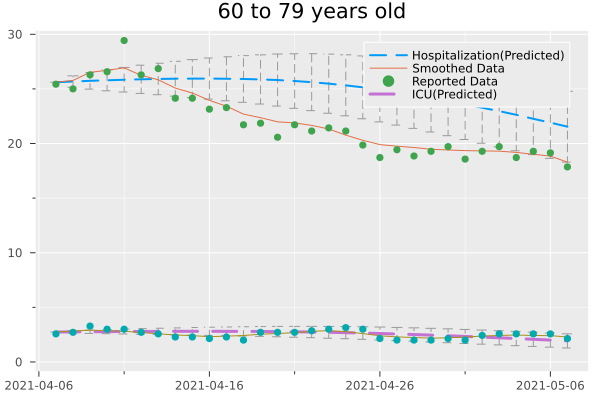

In [8]:
############################# FIRST APPROACH FOR HOSPITALIZATION AND ICU ##########################
###################################################################################################
##### Prediction of Hospitalization and ICU, based on the same curve we obtained for the Infection.
begin
    errorline(1:finish-start+1, y3[:,:]*Max_h_data[1], errorstyle=:stick, label="Hospitalization(Predicted)", lw=2, ls=:dash)
    plot!(h_data[1,start:finish]*Max_h_data[1], label="Smoothed Data", title=age_text) 
    scatter!(h_data_end[1,start:finish], label="Reported Data", title=age_text) 
    #plot!(xformatter= x->Dates.format(dates[Int(x+1)], "yyyy-mm-dd"))
    ylims!(0,NaN)

    errorline!(1:finish-start+1, y4[:,:]*Max_h_data[2], errorstyle=:stick, label="ICU(Predicted)" ,lw=3, ls=:dash)
    plot!(h_data[2,start:finish]*Max_h_data[2], label=false)
    scatter!(h_data_end[2,start:finish], label=false)
    plot!(xformatter= x->Dates.format(dates[Int(x+1)], "yyyy-mm-dd"))
    ylims!(0,NaN)
end

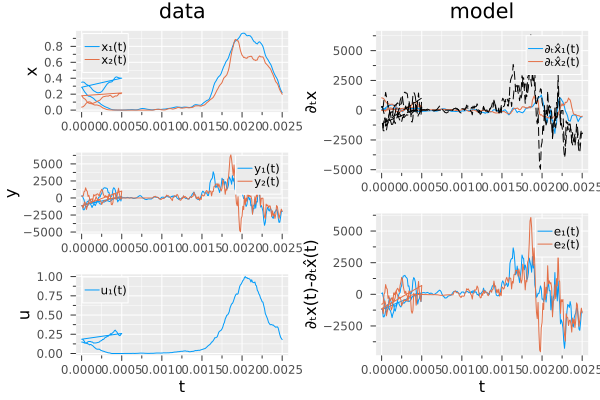

In [9]:
############################# SECOND APPROACH FOR HOSPITALIZATION AND ICU ##########################
###################################################################################################
######################## definition and solving of the seconed problem - HOSPITALIZATION AND ICU ##################
begin
    t1=collect(0.0:1/tick:(split_start-start_training)/tick);
    itp_method=InterpolationMethod(LinearInterpolation)
    #sir_problem1=ContinuousDataDrivenProblem(h_data1, t1, itp_method, U = hcontrol1)

    t2=collect(0.0:1/tick:(finish_training-split_finish)/tick);
    #sir_problem2=ContinuousDataDrivenProblem(h_data2, t2, itp_method, U = hcontrol2)
    
    final_data=(prob1=(X=h_data1, t=t1, itp_method, U=hcontrol1), prob2=(X=h_data2, t=t2, itp_method, U=hcontrol2))
    sir_problem=ContinuousDataset(final_data)#(sir_problem1, sir_problem2)

    @variables u[1:2] c[1:1]
    u = collect(u)
    c = collect(c)

    h = Num[polynomial_basis(u, 1); polynomial_basis(u, 1)c[1];  c[1]]  
    h = Num[polynomial_basis([u; c], 2);]
    basis = Basis(h, u, controls=c)


    ### choosing STLSQ as an optimizer
    ### STLSQ is a sparsifying algorithm that cause the solve function to call its "Sindy" method ###
    opt = STLSQ(exp10.(-10:0.01:-1))


    ddsol = solve(sir_problem, basis, opt)#, options = DataDrivenCommonOptions(data_processing = sampler, digits = 1))#, options = DataDrivenCommonOptions(data_processing = sampler), digits = 1)
    plot(plot(sir_problem, title="data"),plot(ddsol, title="model"), layout=(1,2))
   
end

In [10]:
################## Adding the predicted Infected number ##############
################at the end of the data to calculate again ###############
################## the infection rate of the age_group ###############
begin
    start=split_start# training_days
    finish=split_finish#673

    predicted_infected=mean(y1[:,:], dims=2)
    infected_age_group_pred=copy(infected_age_group)
    infected_age_group_pred[start:finish]=predicted_infected
    
    hcontrol_predicted=vcat(infected_age_group_pred')

end

1×707 Matrix{Float64}:
 0.0  0.000356325  0.000296937  0.000509035  …  0.263086  0.239094  0.196869

In [11]:
################## recovering the dynamic FOR SECOND PROBLEM #########
begin
    ##### range of prediction ####
    start=split_start
    finish=split_finish
    
    res=ddsol
    sys = get_basis(res)
    #println(sys)

    # Optimal parameters
    p_opt = get_parameter_values(sys)
    z0=h_data[:,start]
    ztspan=(start/tick,finish/tick)

    #control[:,286:300].=0.2
   
    function get_infected_number(t)
        down=hcontrol_predicted[1, Int(round(t*tick+1, RoundDown))]
        up=hcontrol_predicted[1, Int(round(t*tick+1, RoundUp))]
        down_co=t*tick-round(t*tick,RoundDown)
        up_co=1-down_co
        control_in_t=down_co*down+up_co*up
        return control_in_t

        #return hcontrol_predicted[3, Int(round(t+1))]
    end

    # Generate a closure on the system 
    f_recovered = let total1 =get_infected_number
        (x, p, t) -> sys(x, p, t, [total1.(t)])
    end
    sys
end

Model ##Basis#365 with 2 equations
States (2):
  u[1]
  u[2]
Parameters (20):
  p₁
  p₂
  p₃
  p₄
⋮

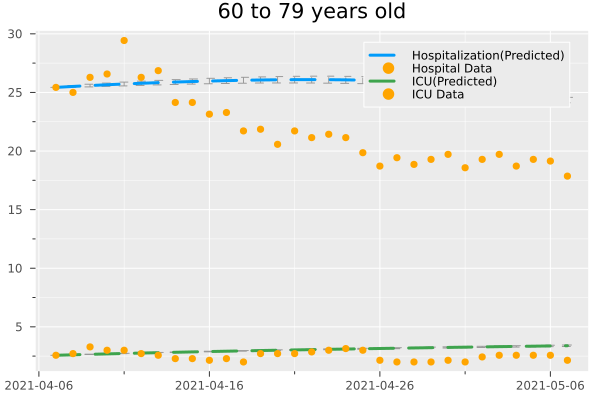

In [12]:
#################### stochastic #########################
########### It is not the best approach, THE MODEL MIGHT BE UNSTABLE #################################
begin
    t_step=1/tick
    beta=1
    g(u,p,t)=beta*u   #### stochastic function and its parameters

   

    ################## StatsPlots ################
    y1 = fill(NaN, finish-start+1, 5000);
    y2 = fill(NaN, finish-start+1, 5000);
    #y3 = fill(NaN, finish-start+1, 5000);
    for i  in 1:5000
        prediction_prob = SDEProblem(f_recovered, g, z0, ztspan, p_opt)
        prediction = solve(prediction_prob, EM(), dt=t_step)
        M=Matrix(prediction)
       
        #tmp=extractInfected(M[1,:], start, finish, data[1,:], cofs)
        y1[:,i]=max.(M[1,:].-(z0[1]-h_data_end[1,start]/Max_h_data[1]),0)
        y2[:,i]=max.(M[2,:].-(z0[2]-h_data_end[2,start]/Max_h_data[2]),0)
     #   y3[:,i]=M[3,:]
    end


    errorline(1:finish-start+1, y1[:,:]*Max_h_data[1], errorstyle=:stick, label="Hospitalization(Predicted)", lw=3, ls=:dash)
    scatter!(h_data_end[1,start:finish], label="Hospital Data", title=age_text, color=:orange) 
    #dates=raw_data[start:finish,1]
    #plot!(xformatter= x->Dates.format(dates[Int(x+1)], "yyyy-mm-dd"), xrot=45)   
    if maximum(h_data_end[1,start:finish]) <10
        ylims!(NaN, 10)
    else
        ylims!(NaN,NaN)
    end        

    errorline!(1:finish-start+1, y2[:,:]*Max_h_data[2], errorstyle=:stick, label="ICU(Predicted)" ,lw=3, ls=:dash)
    scatter!(h_data_end[2,start:finish], label="ICU Data", title=age_text, color=:orange)
    dates=raw_data[start:finish,1]
    plot!(xformatter= x->Dates.format(dates[Int(x+1)], "yyyy-mm-dd"))
    
end

Sampling   0%|█                                         |  ETA: N/A


┌ Info: Found initial step size
│   ϵ = 0.0015625
└ @ Turing.Inference C:\Users\babazadehmorteza\.julia\packages\Turing\iERks\src\inference\hmc.jl:204


Sampling   0%|█                                         |  ETA: 0:41:16
Sampling   1%|█                                         |  ETA: 0:20:37
Sampling   1%|█                                         |  ETA: 0:13:42
Sampling   2%|█                                         |  ETA: 0:10:14
Sampling   2%|█                                         |  ETA: 0:08:09
Sampling   3%|██                                        |  ETA: 0:06:46
Sampling   3%|██                                        |  ETA: 0:05:47


Sampling   4%|██                                        |  ETA: 0:05:03


Sampling   4%|██                                        |  ETA: 0:04:28
Sampling   5%|██                                        |  ETA: 0:04:02
Sampling   5%|███                                       |  ETA: 0:03:39
Sampling   6%|███                                       |  ETA: 0:03:21
Sampling   6%|███                                       |  ETA: 0:03:05


Sampling   7%|███                                       |  ETA: 0:02:51
Sampling   7%|███                                       |  ETA: 0:02:39
Sampling   7%|████                                      |  ETA: 0:02:29
Sampling   8%|████                                      |  ETA: 0:02:20
Sampling   8%|████                                      |  ETA: 0:02:11
Sampling   9%|████                                      |  ETA: 0:02:04


Sampling   9%|████                                      |  ETA: 0:01:57
Sampling  10%|█████                                     |  ETA: 0:01:51
Sampling  10%|█████                                     |  ETA: 0:01:45
Sampling  11%|█████                                     |  ETA: 0:01:40
Sampling  11%|█████                                     |  ETA: 0:01:36
Sampling  12%|█████                                     |  ETA: 0:01:31
Sampling  12%|██████                                    |  ETA: 0:01:27
Sampling  13%|██████                                    |  ETA: 0:01:24
Sampling  13%|██████                                    |  ETA: 0:01:20
Sampling  14%|██████                                    |  ETA: 0:01:17
Sampling  14%|██████                                    |  ETA: 0:01:15
Sampling  14%|███████                                   |  ETA: 0:01:12
Sampling  15%|███████                                   |  ETA: 0:01:09


Sampling  15%|███████                                   |  ETA: 0:01:07
Sampling  16%|███████                                   |  ETA: 0:01:04
Sampling  16%|███████                                   |  ETA: 0:01:02
Sampling  17%|████████                                  |  ETA: 0:01:00
Sampling  17%|████████                                  |  ETA: 0:00:58
Sampling  18%|████████                                  |  ETA: 0:00:57
Sampling  18%|████████                                  |  ETA: 0:00:55
Sampling  19%|████████                                  |  ETA: 0:00:53
Sampling  19%|█████████                                 |  ETA: 0:00:52
Sampling  20%|█████████                                 |  ETA: 0:00:50
Sampling  20%|█████████                                 |  ETA: 0:00:49
Sampling  21%|█████████                                 |  ETA: 0:00:47
Sampling  21%|█████████                                 |  ETA: 0:00:46
Sampling  21%|██████████                                |  ETA: 


Sampling  24%|██████████                                |  ETA: 0:00:39
Sampling  24%|███████████                               |  ETA: 0:00:38
Sampling  25%|███████████                               |  ETA: 0:00:37
Sampling  25%|███████████                               |  ETA: 0:00:36
Sampling  26%|███████████                               |  ETA: 0:00:35
Sampling  26%|███████████                               |  ETA: 0:00:35
Sampling  27%|████████████                              |  ETA: 0:00:34
Sampling  27%|████████████                              |  ETA: 0:00:33
Sampling  28%|████████████                              |  ETA: 0:00:32
Sampling  28%|████████████                              |  ETA: 0:00:32
Sampling  28%|████████████                              |  ETA: 0:00:31
Sampling  29%|█████████████                             |  ETA: 0:00:30
Sampling  29%|█████████████                             |  ETA: 0:00:29
Sampling  30%|█████████████                             |  ETA:


Sampling  34%|███████████████                           |  ETA: 0:00:24
Sampling  34%|███████████████                           |  ETA: 0:00:24
Sampling  35%|███████████████                           |  ETA: 0:00:23
Sampling  35%|███████████████                           |  ETA: 0:00:23
Sampling  35%|███████████████                           |  ETA: 0:00:23
Sampling  36%|████████████████                          |  ETA: 0:00:22
Sampling  36%|████████████████                          |  ETA: 0:00:22
Sampling  37%|████████████████                          |  ETA: 0:00:21
Sampling  37%|████████████████                          |  ETA: 0:00:21
Sampling  38%|████████████████                          |  ETA: 0:00:20
Sampling  38%|█████████████████                         |  ETA: 0:00:20
Sampling  39%|█████████████████                         |  ETA: 0:00:20
Sampling  39%|█████████████████                         |  ETA: 0:00:19
Sampling  40%|█████████████████                         |  ETA:

Sampling  45%|███████████████████                       |  ETA: 0:00:15
Sampling  45%|████████████████████                      |  ETA: 0:00:15
Sampling  46%|████████████████████                      |  ETA: 0:00:15
Sampling  46%|████████████████████                      |  ETA: 0:00:15
Sampling  47%|████████████████████                      |  ETA: 0:00:14
Sampling  47%|████████████████████                      |  ETA: 0:00:14
Sampling  48%|████████████████████                      |  ETA: 0:00:14
Sampling  48%|█████████████████████                     |  ETA: 0:00:14
Sampling  49%|█████████████████████                     |  ETA: 0:00:13
Sampling  49%|█████████████████████                     |  ETA: 0:00:13
Sampling  49%|█████████████████████                     |  ETA: 0:00:13
Sampling  50%|█████████████████████                     |  ETA: 0:00:13
Sampling  50%|██████████████████████                    |  ETA: 0:00:12
Sampling  51%|██████████████████████                    |  ETA: 

Sampling  52%|██████████████████████                    |  ETA: 0:00:11
Sampling  53%|███████████████████████                   |  ETA: 0:00:11
Sampling  53%|███████████████████████                   |  ETA: 0:00:11
Sampling  54%|███████████████████████                   |  ETA: 0:00:11
Sampling  54%|███████████████████████                   |  ETA: 0:00:11
Sampling  55%|███████████████████████                   |  ETA: 0:00:10
Sampling  55%|████████████████████████                  |  ETA: 0:00:10
Sampling  56%|████████████████████████                  |  ETA: 0:00:10
Sampling  56%|████████████████████████                  |  ETA: 0:00:10
Sampling  56%|████████████████████████                  |  ETA: 0:00:10
Sampling  57%|████████████████████████                  |  ETA: 0:00:10
Sampling  57%|█████████████████████████                 |  ETA: 0:00:09
Sampling  58%|█████████████████████████                 |  ETA: 0:00:09
Sampling  58%|█████████████████████████                 |  ETA: 

Sampling  65%|████████████████████████████              |  ETA: 0:00:07
Sampling  65%|████████████████████████████              |  ETA: 0:00:07
Sampling  66%|████████████████████████████              |  ETA: 0:00:07
Sampling  66%|████████████████████████████              |  ETA: 0:00:06
Sampling  67%|█████████████████████████████             |  ETA: 0:00:06
Sampling  67%|█████████████████████████████             |  ETA: 0:00:06
Sampling  68%|█████████████████████████████             |  ETA: 0:00:06
Sampling  68%|█████████████████████████████             |  ETA: 0:00:06
Sampling  69%|█████████████████████████████             |  ETA: 0:00:06
Sampling  69%|██████████████████████████████            |  ETA: 0:00:06
Sampling  70%|██████████████████████████████            |  ETA: 0:00:06
Sampling  70%|██████████████████████████████            |  ETA: 0:00:05
Sampling  70%|██████████████████████████████            |  ETA: 0:00:05
Sampling  71%|██████████████████████████████            |  ETA: 

Sampling  78%|█████████████████████████████████         |  ETA: 0:00:04
Sampling  79%|██████████████████████████████████        |  ETA: 0:00:03
Sampling  79%|██████████████████████████████████        |  ETA: 0:00:03
Sampling  80%|██████████████████████████████████        |  ETA: 0:00:03
Sampling  80%|██████████████████████████████████        |  ETA: 0:00:03
Sampling  81%|██████████████████████████████████        |  ETA: 0:00:03
Sampling  81%|███████████████████████████████████       |  ETA: 0:00:03
Sampling  82%|███████████████████████████████████       |  ETA: 0:00:03
Sampling  82%|███████████████████████████████████       |  ETA: 0:00:03
Sampling  83%|███████████████████████████████████       |  ETA: 0:00:03
Sampling  83%|███████████████████████████████████       |  ETA: 0:00:03
Sampling  84%|████████████████████████████████████      |  ETA: 0:00:03
Sampling  84%|████████████████████████████████████      |  ETA: 0:00:02
Sampling  84%|████████████████████████████████████      |  ETA: 

Sampling  88%|██████████████████████████████████████    |  ETA: 0:00:02
Sampling  89%|██████████████████████████████████████    |  ETA: 0:00:02
Sampling  89%|██████████████████████████████████████    |  ETA: 0:00:02
Sampling  90%|██████████████████████████████████████    |  ETA: 0:00:01
Sampling  90%|██████████████████████████████████████    |  ETA: 0:00:01
Sampling  91%|███████████████████████████████████████   |  ETA: 0:00:01
Sampling  91%|███████████████████████████████████████   |  ETA: 0:00:01
Sampling  91%|███████████████████████████████████████   |  ETA: 0:00:01
Sampling  92%|███████████████████████████████████████   |  ETA: 0:00:01
Sampling  92%|███████████████████████████████████████   |  ETA: 0:00:01
Sampling  93%|████████████████████████████████████████  |  ETA: 0:00:01
Sampling  93%|████████████████████████████████████████  |  ETA: 0:00:01
Sampling  94%|████████████████████████████████████████  |  ETA: 0:00:01
Sampling  94%|████████████████████████████████████████  |  ETA: 


Sampling 100%|██████████████████████████████████████████| Time: 0:00:13


Sampling   0%|█                                         |  ETA: N/A
┌ Info: Found initial step size
│   ϵ = 0.0015625
└ @ Turing.Inference C:\Users\babazadehmorteza\.julia\packages\Turing\iERks\src\inference\hmc.jl:204
Sampling   0%|█                                         |  ETA: 0:00:01
Sampling   1%|█                                         |  ETA: 0:00:03
Sampling   1%|█                                         |  ETA: 0:00:02
Sampling   2%|█                                         |  ETA: 0:00:02
Sampling   2%|█                                         |  ETA: 0:00:02
Sampling   3%|██                                        |  ETA: 0:00:03


Sampling   3%|██                                        |  ETA: 0:00:03
Sampling   4%|██                                        |  ETA: 0:00:04
Sampling   4%|██                                        |  ETA: 0:00:04


Sampling   5%|██                                        |  ETA: 0:00:04
Sampling   5%|███                                       |  ETA: 0:00:05
Sampling   6%|███                                       |  ETA: 0:00:05


Sampling   6%|███                                       |  ETA: 0:00:05
Sampling   7%|███                                       |  ETA: 0:00:05
Sampling   7%|███                                       |  ETA: 0:00:05
Sampling   7%|████                                      |  ETA: 0:00:05


Sampling   8%|████                                      |  ETA: 0:00:05
Sampling   8%|████                                      |  ETA: 0:00:05
Sampling   9%|████                                      |  ETA: 0:00:05
Sampling   9%|████                                      |  ETA: 0:00:05
Sampling  10%|█████                                     |  ETA: 0:00:05
Sampling  10%|█████                                     |  ETA: 0:00:04
Sampling  11%|█████                                     |  ETA: 0:00:04
Sampling  11%|█████                                     |  ETA: 0:00:04


Sampling  12%|█████                                     |  ETA: 0:00:04
Sampling  12%|██████                                    |  ETA: 0:00:04
Sampling  13%|██████                                    |  ETA: 0:00:04
Sampling  13%|██████                                    |  ETA: 0:00:04
Sampling  14%|██████                                    |  ETA: 0:00:04
Sampling  14%|██████                                    |  ETA: 0:00:04
Sampling  14%|███████                                   |  ETA: 0:00:04
Sampling  15%|███████                                   |  ETA: 0:00:03
Sampling  15%|███████                                   |  ETA: 0:00:03
Sampling  16%|███████                                   |  ETA: 0:00:03
Sampling  16%|███████                                   |  ETA: 0:00:03
Sampling  17%|████████                                  |  ETA: 0:00:03
Sampling  17%|████████                                  |  ETA: 0:00:03
Sampling  18%|████████                                  |  ETA: 

Sampling  19%|████████                                  |  ETA: 0:00:03
Sampling  19%|█████████                                 |  ETA: 0:00:03
Sampling  20%|█████████                                 |  ETA: 0:00:03
Sampling  20%|█████████                                 |  ETA: 0:00:03
Sampling  21%|█████████                                 |  ETA: 0:00:03
Sampling  21%|█████████                                 |  ETA: 0:00:03
Sampling  21%|██████████                                |  ETA: 0:00:03
Sampling  22%|██████████                                |  ETA: 0:00:02
Sampling  22%|██████████                                |  ETA: 0:00:02
Sampling  23%|██████████                                |  ETA: 0:00:02
Sampling  23%|██████████                                |  ETA: 0:00:02
Sampling  24%|██████████                                |  ETA: 0:00:02
Sampling  24%|███████████                               |  ETA: 0:00:02
Sampling  25%|███████████                               |  ETA: 

Sampling  28%|████████████                              |  ETA: 0:00:02
Sampling  28%|████████████                              |  ETA: 0:00:02
Sampling  28%|████████████                              |  ETA: 0:00:02
Sampling  29%|█████████████                             |  ETA: 0:00:02
Sampling  29%|█████████████                             |  ETA: 0:00:02
Sampling  30%|█████████████                             |  ETA: 0:00:02
Sampling  30%|█████████████                             |  ETA: 0:00:02
Sampling  31%|█████████████                             |  ETA: 0:00:02
Sampling  31%|██████████████                            |  ETA: 0:00:02


Sampling  32%|██████████████                            |  ETA: 0:00:02
Sampling  32%|██████████████                            |  ETA: 0:00:02
Sampling  33%|██████████████                            |  ETA: 0:00:02
Sampling  33%|██████████████                            |  ETA: 0:00:02
Sampling  34%|███████████████                           |  ETA: 0:00:02
Sampling  34%|███████████████                           |  ETA: 0:00:02
Sampling  35%|███████████████                           |  ETA: 0:00:02
Sampling  35%|███████████████                           |  ETA: 0:00:02
Sampling  35%|███████████████                           |  ETA: 0:00:02
Sampling  36%|████████████████                          |  ETA: 0:00:02
Sampling  36%|████████████████                          |  ETA: 0:00:02
Sampling  37%|████████████████                          |  ETA: 0:00:02
Sampling  37%|████████████████                          |  ETA: 0:00:02
Sampling  38%|████████████████                          |  ETA: 

Sampling  42%|██████████████████                        |  ETA: 0:00:01
Sampling  42%|██████████████████                        |  ETA: 0:00:01
Sampling  42%|██████████████████                        |  ETA: 0:00:01
Sampling  43%|███████████████████                       |  ETA: 0:00:01
Sampling  43%|███████████████████                       |  ETA: 0:00:01
Sampling  44%|███████████████████                       |  ETA: 0:00:01
Sampling  44%|███████████████████                       |  ETA: 0:00:01
Sampling  45%|███████████████████                       |  ETA: 0:00:01
Sampling  45%|████████████████████                      |  ETA: 0:00:01
Sampling  46%|████████████████████                      |  ETA: 0:00:01
Sampling  46%|████████████████████                      |  ETA: 0:00:01
Sampling  47%|████████████████████                      |  ETA: 0:00:01
Sampling  47%|████████████████████                      |  ETA: 0:00:01


Sampling  48%|████████████████████                      |  ETA: 0:00:01
Sampling  48%|█████████████████████                     |  ETA: 0:00:01
Sampling  49%|█████████████████████                     |  ETA: 0:00:01
Sampling  49%|█████████████████████                     |  ETA: 0:00:01
Sampling  49%|█████████████████████                     |  ETA: 0:00:01
Sampling  50%|█████████████████████                     |  ETA: 0:00:01
Sampling  50%|██████████████████████                    |  ETA: 0:00:01
Sampling  51%|██████████████████████                    |  ETA: 0:00:01
Sampling  51%|██████████████████████                    |  ETA: 0:00:01
Sampling  52%|██████████████████████                    |  ETA: 0:00:01
Sampling  52%|██████████████████████                    |  ETA: 0:00:01


Sampling  53%|███████████████████████                   |  ETA: 0:00:01
Sampling  53%|███████████████████████                   |  ETA: 0:00:01
Sampling  54%|███████████████████████                   |  ETA: 0:00:01
Sampling  54%|███████████████████████                   |  ETA: 0:00:01
Sampling  55%|███████████████████████                   |  ETA: 0:00:01
Sampling  55%|████████████████████████                  |  ETA: 0:00:01
Sampling  56%|████████████████████████                  |  ETA: 0:00:01
Sampling  56%|████████████████████████                  |  ETA: 0:00:01
Sampling  56%|████████████████████████                  |  ETA: 0:00:01
Sampling  57%|████████████████████████                  |  ETA: 0:00:01
Sampling  57%|█████████████████████████                 |  ETA: 0:00:01
Sampling  58%|█████████████████████████                 |  ETA: 0:00:01
Sampling  58%|█████████████████████████                 |  ETA: 0:00:01
Sampling  59%|█████████████████████████                 |  ETA: 

Sampling  61%|██████████████████████████                |  ETA: 0:00:01
Sampling  62%|██████████████████████████                |  ETA: 0:00:01
Sampling  62%|███████████████████████████               |  ETA: 0:00:01
Sampling  63%|███████████████████████████               |  ETA: 0:00:01
Sampling  63%|███████████████████████████               |  ETA: 0:00:01
Sampling  63%|███████████████████████████               |  ETA: 0:00:01
Sampling  64%|███████████████████████████               |  ETA: 0:00:01
Sampling  64%|████████████████████████████              |  ETA: 0:00:01
Sampling  65%|████████████████████████████              |  ETA: 0:00:01
Sampling  65%|████████████████████████████              |  ETA: 0:00:01


Sampling  66%|████████████████████████████              |  ETA: 0:00:01
Sampling  66%|████████████████████████████              |  ETA: 0:00:01
Sampling  67%|█████████████████████████████             |  ETA: 0:00:01
Sampling  67%|█████████████████████████████             |  ETA: 0:00:01
Sampling  68%|█████████████████████████████             |  ETA: 0:00:01
Sampling  68%|█████████████████████████████             |  ETA: 0:00:01
Sampling  69%|█████████████████████████████             |  ETA: 0:00:01
Sampling  69%|██████████████████████████████            |  ETA: 0:00:01
Sampling  70%|██████████████████████████████            |  ETA: 0:00:01
Sampling  70%|██████████████████████████████            |  ETA: 0:00:01
Sampling  70%|██████████████████████████████            |  ETA: 0:00:01


Sampling  71%|██████████████████████████████            |  ETA: 0:00:01
Sampling  71%|██████████████████████████████            |  ETA: 0:00:01
Sampling  72%|███████████████████████████████           |  ETA: 0:00:01
Sampling  72%|███████████████████████████████           |  ETA: 0:00:01
Sampling  73%|███████████████████████████████           |  ETA: 0:00:01
Sampling  73%|███████████████████████████████           |  ETA: 0:00:01
Sampling  74%|███████████████████████████████           |  ETA: 0:00:01
Sampling  74%|████████████████████████████████          |  ETA: 0:00:01
Sampling  75%|████████████████████████████████          |  ETA: 0:00:01
Sampling  75%|████████████████████████████████          |  ETA: 0:00:01
Sampling  76%|████████████████████████████████          |  ETA: 0:00:01
Sampling  76%|████████████████████████████████          |  ETA: 0:00:00
Sampling  77%|█████████████████████████████████         |  ETA: 0:00:00


Sampling  77%|█████████████████████████████████         |  ETA: 0:00:00
Sampling  77%|█████████████████████████████████         |  ETA: 0:00:00
Sampling  78%|█████████████████████████████████         |  ETA: 0:00:00
Sampling  78%|█████████████████████████████████         |  ETA: 0:00:00
Sampling  79%|██████████████████████████████████        |  ETA: 0:00:00
Sampling  79%|██████████████████████████████████        |  ETA: 0:00:00
Sampling  80%|██████████████████████████████████        |  ETA: 0:00:00
Sampling  80%|██████████████████████████████████        |  ETA: 0:00:00
Sampling  81%|██████████████████████████████████        |  ETA: 0:00:00
Sampling  81%|███████████████████████████████████       |  ETA: 0:00:00
Sampling  82%|███████████████████████████████████       |  ETA: 0:00:00
Sampling  82%|███████████████████████████████████       |  ETA: 0:00:00
Sampling  83%|███████████████████████████████████       |  ETA: 0:00:00
Sampling  83%|███████████████████████████████████       |  ETA: 

Sampling  85%|████████████████████████████████████      |  ETA: 0:00:00
Sampling  86%|█████████████████████████████████████     |  ETA: 0:00:00
Sampling  86%|█████████████████████████████████████     |  ETA: 0:00:00
Sampling  87%|█████████████████████████████████████     |  ETA: 0:00:00
Sampling  87%|█████████████████████████████████████     |  ETA: 0:00:00
Sampling  88%|█████████████████████████████████████     |  ETA: 0:00:00
Sampling  88%|██████████████████████████████████████    |  ETA: 0:00:00
Sampling  89%|██████████████████████████████████████    |  ETA: 0:00:00
Sampling  89%|██████████████████████████████████████    |  ETA: 0:00:00
Sampling  90%|██████████████████████████████████████    |  ETA: 0:00:00
Sampling  90%|██████████████████████████████████████    |  ETA: 0:00:00
Sampling  91%|███████████████████████████████████████   |  ETA: 0:00:00


Sampling  91%|███████████████████████████████████████   |  ETA: 0:00:00
Sampling  91%|███████████████████████████████████████   |  ETA: 0:00:00
Sampling  92%|███████████████████████████████████████   |  ETA: 0:00:00
Sampling  92%|███████████████████████████████████████   |  ETA: 0:00:00
Sampling  93%|████████████████████████████████████████  |  ETA: 0:00:00
Sampling  93%|████████████████████████████████████████  |  ETA: 0:00:00
Sampling  94%|████████████████████████████████████████  |  ETA: 0:00:00
Sampling  94%|████████████████████████████████████████  |  ETA: 0:00:00
Sampling  95%|████████████████████████████████████████  |  ETA: 0:00:00
Sampling  95%|████████████████████████████████████████  |  ETA: 0:00:00
Sampling  96%|█████████████████████████████████████████ |  ETA: 0:00:00
Sampling  96%|█████████████████████████████████████████ |  ETA: 0:00:00
Sampling  97%|█████████████████████████████████████████ |  ETA: 0:00:00
Sampling  97%|█████████████████████████████████████████ |  ETA:

Sampling  98%|██████████████████████████████████████████|  ETA: 0:00:00
Sampling  99%|██████████████████████████████████████████|  ETA: 0:00:00
Sampling  99%|██████████████████████████████████████████|  ETA: 0:00:00
Sampling 100%|██████████████████████████████████████████|  ETA: 0:00:00
Sampling 100%|██████████████████████████████████████████| Time: 0:00:01


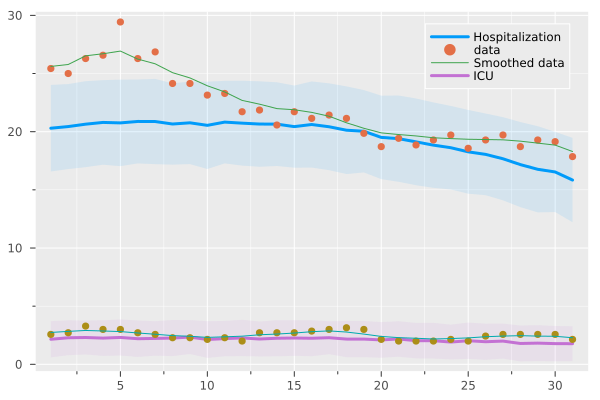

In [18]:
############################# THIRD APPROACH FOR HOSPITALIZATION AND ICU ##########################
###################################################################################################
#### Predicting the number of Hospitalization and ICU by means of Bayesian Statistics ########
using Turing
begin
    # Define the probabilistic model
    Turing.@model function hospitalization_model(infections, hospitalizations)
        n = length(infections)
        
        # Priors
        α ~ Normal(0, 1)
        β ~ Normal(0, 1)
        σ ~ Uniform(0,10)
        # Model
        for i in 1:n
            μ = α + β * infections[i]
            hospitalizations[i] ~ Normal(μ, σ)
        end
    end

    # Generate sample data (replace with your actual data)
    infections = data1[1,[1:start; finish:680]].*Max_data1[1]
    hospitalizations =h_data_end[1,[1:start; finish:680]]
    ICU =h_data_end[2,1:680]
    # Run MCMC sampling
    chain = sample(hospitalization_model(infections, hospitalizations), NUTS(), 1000)
    chain1 = sample(hospitalization_model(infections, ICU), NUTS(), 1000)
    # Extract the posterior samples
    posterior = chain[:α], chain[:β], chain[:σ]
    posterior1 = chain1[:α], chain1[:β], chain1[:σ]
    # Predict the number of hospitalizations for a new infection value
    new_infections =infected_age_group_pred[start:finish].*Max_data1[1] #infected_age_group_pred[start:finish]#data1[1,finish_training-100:finish_training].
    all_prediction=[]
    all_prediction1=[]
    #predicted_hospitalizations = Float64[]
    for j in eachindex(new_infections)
        predicted_hospitalizations = Float64[]
        predicted_icu = Float64[]
        for i in 1:length(posterior[1])
            α = posterior[1][i]
            β = posterior[2][i]
            σ = posterior[3][i]
            μ = α + β * new_infections[j]
            hospitalizations_pred = rand(Normal(μ, σ))
            push!(predicted_hospitalizations, hospitalizations_pred)

            α1 = posterior1[1][i]
            β1 = posterior1[2][i]
            σ1 = posterior1[3][i]
            μ1 = α1 + β1 * new_infections[j]
            icu_pred = rand(Normal(μ1, σ1))
            push!(predicted_icu, icu_pred)
        end
        push!(all_prediction, predicted_hospitalizations)
        push!(all_prediction1, predicted_icu)
    end
    # Summary of predicted hospitalizations
    #println("Predicted hospitalizations for $new_infections infections:")
    #describe(predicted_hospitalizations)
    ttt=reduce(hcat, all_prediction);
    ttt1=reduce(hcat, all_prediction1);
    errorline(1:finish-start+1,ttt', errorstyle=:ribbon, label="Hospitalization", lw=3)
    scatter!(h_data_end[1,start:finish], label="data")#, fillalpha=0.003, alpha=0.02)
    plot!(h_data[1,start:finish].*Max_h_data[1], label="Smoothed data")
    errorline!(1:finish-start+1,ttt1', errorstyle=:ribbon, label="ICU", lw=3)
    scatter!(h_data_end[2,start:finish], label=false)
    plot!(h_data[2,start:finish].*Max_h_data[2], label=false)
end

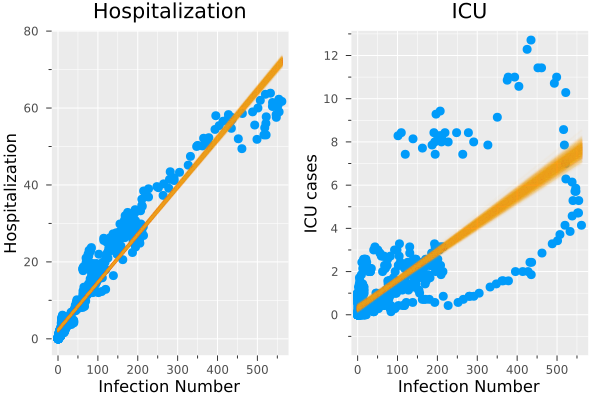

In [19]:
##### Plotting the probabilistic regression, obtained by Bayesian Statistics
begin
    p_turing=scatter(infections, hospitalizations, ms=5, legend=false, xlabel="Infection Number", ylabel="Hospitalization", title="Hospitalization")
    for i in 1:length(posterior[1])
        intercept = chain[i, 1, 1]
        slope = chain[i, 2, 1]
        error = chain[i, 3, 1]
        plot!(p_turing, x -> intercept + slope * x,
            legend = false,
            # samples
            linewidth = 2, color=:orange,  alpha = 0.02,
            # error
            ribbon = error, fillalpha = 0.003
        )
    end
    p_turing1=scatter(infections, ICU, ms=5, legend=false, xlabel="Infection Number", ylabel="ICU cases", title="ICU")
    for i in 1:length(posterior1[1])
        intercept = chain1[i, 1, 1]
        slope = chain1[i, 2, 1]
        error = chain1[i, 3, 1]
        plot!(p_turing1, x -> intercept + slope * x,
            legend = false,
            # samples
            linewidth = 2, color=:orange,  alpha = 0.02,
            # error
            ribbon = error, fillalpha = 0.003
        )
    end
    plot(p_turing, p_turing1)
end